In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cfgrib
import datetime
from scipy import stats
from scipy import interpolate
from scipy.interpolate import splrep, BSpline
import cartopy.crs as ccrs
import seaborn as sns
from mpl_toolkits.basemap import Basemap
import statistics

In [2]:
ds = xr.open_dataset("3cc1af4426ee22d453c5d8338d4ec193.nc")

/usr/lib/python3/dist-packages/xarray/backends/plugins.py:68: RuntimeWarning: Engine 'cfgrib' loading failed:
xarray_plugin module needs xarray version >= 0.18+
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


In [3]:
ds_1940 = ds.sel(date=slice("19400101", "19401201"))
#ds_1940 = ds_1940.mean(("valid_time"))

mean_ds_1940 = ds_1940.mean(dim = "date")
mean_ds_1940_SST= mean_ds_1940.sst.load() 

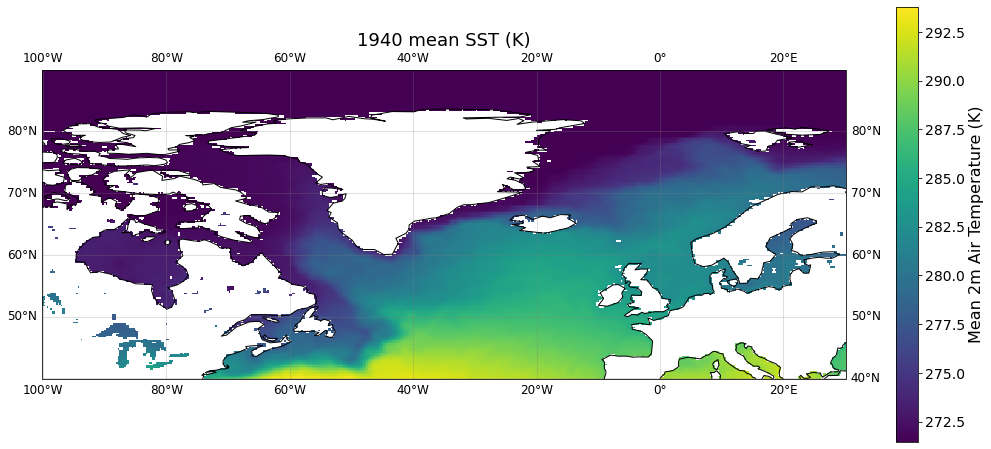

In [4]:
plt.figure(figsize=(18, 8))
p = mean_ds_1940_SST.plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
)

p.axes.coastlines()

# Define the gridlines with larger label font sizes for latitude and longitude
gl = p.axes.gridlines(
    draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='-'
)
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}

p.axes.set_title('1940 mean SST (K)', fontsize=18)
p.colorbar.set_label('Mean 2m Air Temperature (K)', fontsize=16)
p.colorbar.ax.tick_params(labelsize=14)

p.set_label('Mean 2m air temperature (K)')

# Correlation Map 

In [5]:
yearly_slices = {}

for year in range(1940, 2001):
    # Create a string representation of the start and end of the year
    start_date = f"{year}0101"
    
    end_date = f"{year}1201"
    
    # Select the data for the given year and store it in the dictionary
    yearly_slices[f"ds_{year}"] = ds.sel(date=slice(start_date, end_date))

In [6]:
yearly_mean_annual_to_combine = {}

for year in range(1940, 2001):
    yearly_slices_mean = yearly_slices[f"ds_{year}"].mean(dim="date")
    yearly_slices_mean_annual = yearly_slices_mean.assign_coords(year=(year))
    yearly_mean_annual_to_combine[f"ds_{year}"] = yearly_slices_mean_annual.expand_dims(dim={"year": 1})
    

all_years_combined = []

for year in range(1940, 2001):
    all_years_combined.append(yearly_mean_annual_to_combine[f"ds_{year}"])

# Now combine all datasets by coordinates
yearly_mean_annual_combined = xr.concat(all_years_combined, dim="year")

yearly_mean_annual_combined

<xarray.Dataset>
Dimensions:    (latitude: 201, longitude: 521, year: 61)
Coordinates:
    number     int64 0
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... 40.5 40.25 40.0
  * longitude  (longitude) float64 -100.0 -99.75 -99.5 ... 29.5 29.75 30.0
  * year       (year) int64 1940 1941 1942 1943 1944 ... 1997 1998 1999 2000
Data variables:
    sst        (year, latitude, longitude) float32 271.5 271.5 271.5 ... nan nan

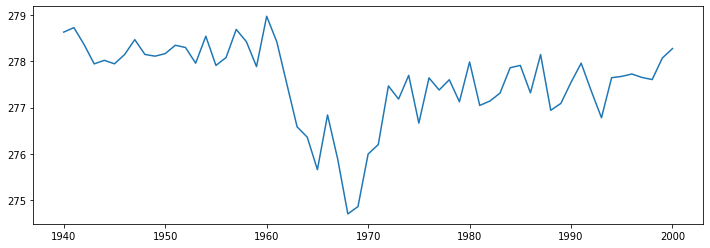

In [8]:
# Find the coordinate closest to where the proxy comes from 

Reynolds_nearest_coord = yearly_mean_annual_combined.sel(latitude=66.5265,longitude=-18.195667, method='nearest')

Reynolds_nearest_coord_sst = Reynolds_nearest_coord.sst.load()

time = Reynolds_nearest_coord.year.load()

plt.figure().set_figwidth(12)
plt.plot(time, Reynolds_nearest_coord_sst)

In [9]:
lat = np.arange(40, 91, 0.5)
lon = np.arange(-100, 31, 0.5)


data = {
    'Latitude': [],
    'Longitude': [],
    'R_value': [], 
    'P_value':[]
}

df = pd.DataFrame(data)

for i in range(len(lat)): 
    for j in range(len(lon)): 
        ERA5_coord_SST = yearly_mean_annual_combined.sel(latitude=lat[i],longitude=lon[j], method='nearest')
        ERA5_coord_SST = ERA5_coord_SST.sst.load()
        #print(ERA5_coord_SST) 
        slope, intercept, rvalue, pvalue, stderr = stats.linregress(Reynolds_nearest_coord_sst, ERA5_coord_SST)
        #print(slope)
        df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)

csv_file_path = 'Reynolds_correlation_map_data.xlsx'   
df.to_excel(csv_file_path, index=False)
        
#df['Latitude']

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_SST.longitude.load()), 'R_value': rvalue, 'P_value': pvalue}, ignore_index=True)
/tmp/ipykernel_1436792/2017764274.py:21: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Latitude': np.array(ERA5_coord_SST.latitude.load()), 'Longitude': np.array(ERA5_coord_S

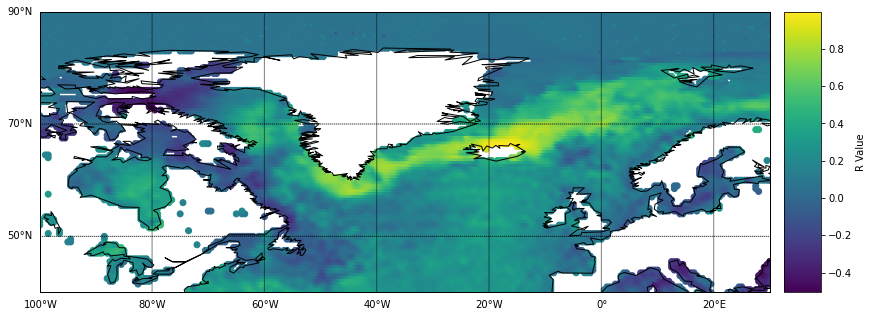

In [10]:
fig = plt.figure(figsize = (14,8))

m = Basemap(projection='cyl',llcrnrlat=40,urcrnrlat=90,\
            llcrnrlon=-100,urcrnrlon=30,resolution='c')

[xplot,yplot] = m(df['Longitude'],df['Latitude'])

R = df['R_value']

s = plt.scatter(xplot, yplot, c=R, cmap='viridis')


cbar = m.colorbar(s)
cbar.set_label('R Value')

m.drawcoastlines()
m.drawmapboundary()
m.drawmeridians(range(-180,181,20),labels=[0,0,0,1])
m.drawparallels(range(-90,91,20),labels=[1,0,0,0])

#m.update_coloraxes(autocolorscale=True, cmax=0.1)

plt.show()

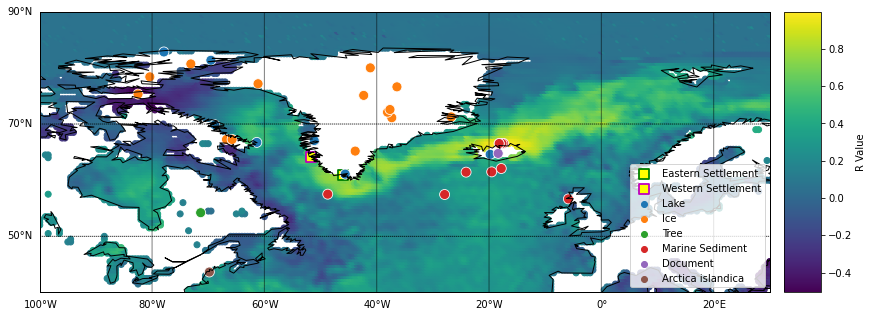

In [26]:
data = pd.read_excel('2024_09_20_Data_Location.xlsx')

fig = plt.figure(figsize = (14,8))

m = Basemap(projection='cyl',llcrnrlat=40,urcrnrlat=90,\
            llcrnrlon=-100,urcrnrlon=30,resolution='c')

lat = data.iloc[:,1]
lon = data.iloc[:,2]

[xplot,yplot] = m(df['Longitude'],df['Latitude'])

R = df['R_value']

s = plt.scatter(xplot, yplot, c=R, cmap='viridis')


cbar = m.colorbar(s)
cbar.set_label('R Value')

m.scatter(-46.058613, 60.916668, s = 120, color = '#ffff00', marker = "s", edgecolors = "g",linewidths = 1.8, label = "Eastern Settlement")
m.scatter(-51.72157, 64.18347, s = 120, color = '#ffff00', marker = "s", edgecolors = "m", linewidths = 1.8, label = "Western Settlement")


sns.scatterplot(data=data, x=lon, y=lat, hue='Type', palette='tab10', s = 100)


m.drawcoastlines()
m.drawmapboundary()
m.drawmeridians(range(-180,181,20),labels=[0,0,0,1])
m.drawparallels(range(-90,91,20),labels=[1,0,0,0])

plt.gca().invert_yaxis()


#m.update_coloraxes(autocolorscale=True, cmax=0.1)

plt.legend()

plt.show()

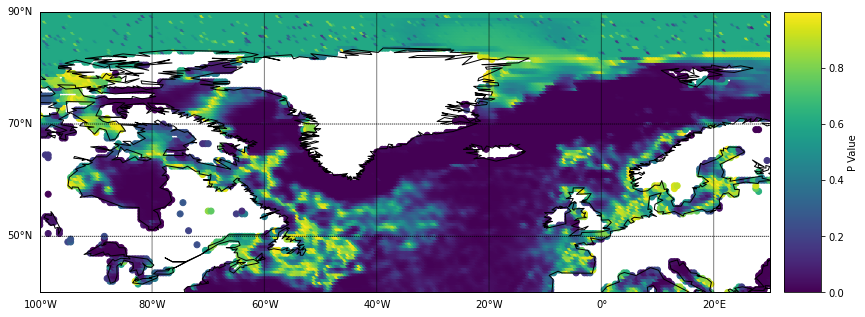

In [16]:
fig = plt.figure(figsize = (14,8))

m = Basemap(projection='cyl',llcrnrlat=40,urcrnrlat=90,\
            llcrnrlon=-100,urcrnrlon=30,resolution='c')

[xplot,yplot] = m(df['Longitude'],df['Latitude'])

P = df['P_value']

s = plt.scatter(xplot, yplot, c=P, cmap='viridis')

cbar = m.colorbar(s)
cbar.set_label('P Value')

m.drawcoastlines()
m.drawmapboundary()
m.drawmeridians(range(-180,181,20),labels=[0,0,0,1])
m.drawparallels(range(-90,91,20),labels=[1,0,0,0])

plt.show()

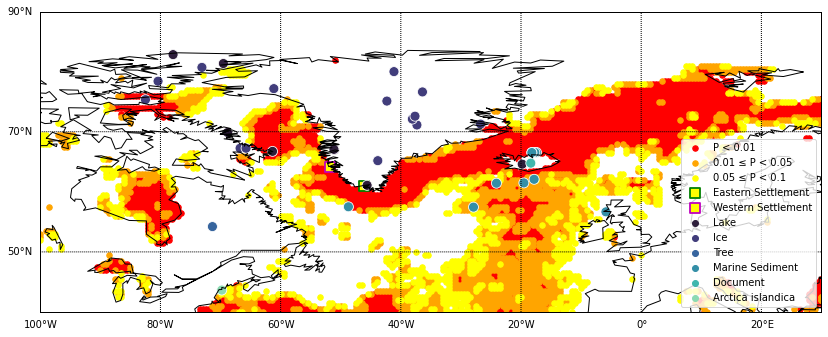

In [46]:
sns.color_palette("dark")

df_01 = df[df['P_value'] < 0.01]
df_05 = df[(df['P_value'] >= 0.01) & (df['P_value'] < 0.05)]
df_10 = df[(df['P_value'] >= 0.05) & (df['P_value'] < 0.1)]

fig = plt.figure(figsize=(14,8))
m = Basemap(projection='cyl', llcrnrlat=40, urcrnrlat=90, 
            llcrnrlon=-100, urcrnrlon=30, resolution='c')

# Convert the coordinates to map projection
xplot_01, yplot_01 = m(df_01['Longitude'], df_01['Latitude'])
xplot_05, yplot_05 = m(df_05['Longitude'], df_05['Latitude'])
xplot_10, yplot_10 = m(df_10['Longitude'], df_10['Latitude'])

# Plot each p-value threshold with different colors
sc_01 = m.scatter(xplot_01, yplot_01, c='red', label='P < 0.01', s=30)
sc_05 = m.scatter(xplot_05, yplot_05, c='orange', label='0.01 ≤ P < 0.05', s=30)
sc_10 = m.scatter(xplot_10, yplot_10, c='yellow', label='0.05 ≤ P < 0.1', s=30)

# Add colorbar (optional, since we are using distinct colors)
# If you want color gradient for p-value you can create a colorbar
# cbar = m.colorbar(sc_01) 
# cbar.set_label('P Value')

m.scatter(-46.058613, 60.916668, s = 120, color = '#ffff00', marker = "s", edgecolors = "g",linewidths = 1.8, label = "Eastern Settlement")
m.scatter(-51.72157, 64.18347, s = 120, color = '#ffff00', marker = "s", edgecolors = "m", linewidths = 1.8, label = "Western Settlement")


sns.scatterplot(data=data, x=lon, y=lat, hue='Type', s = 100, palette="mako")

# Add coastlines and other map features
m.drawcoastlines()
m.drawmapboundary()
m.drawmeridians(range(-180, 181, 20), labels=[0, 0, 0, 1])
m.drawparallels(range(-90, 91, 20), labels=[1, 0, 0, 0])

plt.gca().invert_yaxis()

# Add a legend to distinguish the p-value ranges
plt.legend(loc='lower right')

# Show the plot
plt.show()

# Correlation between ERA5 and Reynolds modern data¶

In [47]:
Reynolds_data = pd.read_excel('2024_11_07_Data.xlsx', sheet_name = "Reynolds_et_al_modern")

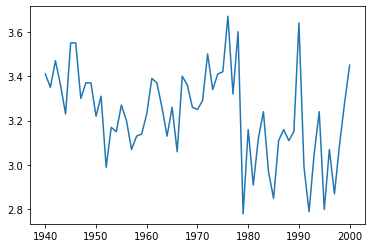

In [48]:
Reynolds_date = Reynolds_data.iloc[:,0]
Reynolds_d18O = Reynolds_data.iloc[:,1]

plt.plot(Reynolds_date, Reynolds_d18O)

In [49]:
ERA5_1940_2000 = Reynolds_nearest_coord_sst.sel(year=slice("1940", "2000"))

In [50]:
ERA5_1940_2000

<xarray.DataArray 'sst' (year: 61)>
array([278.6332 , 278.73032, 278.3662 , 277.94614, 278.02332, 277.9473 ,
       278.14908, 278.4704 , 278.14993, 278.11295, 278.16812, 278.34894,
       278.30008, 277.961  , 278.5442 , 277.91275, 278.0839 , 278.6911 ,
       278.4268 , 277.88712, 278.9764 , 278.4224 , 277.50046, 276.5845 ,
       276.36093, 275.65817, 276.84158, 275.88828, 274.70108, 274.85934,
       275.99573, 276.20004, 277.46878, 277.1852 , 277.69766, 276.66504,
       277.64337, 277.38107, 277.6033 , 277.12695, 277.98782, 277.04755,
       277.1418 , 277.31467, 277.86304, 277.913  , 277.31976, 278.14804,
       276.94247, 277.09128, 277.5472 , 277.9612 , 277.35684, 276.78134,
       277.64713, 277.67566, 277.72687, 277.6517 , 277.6069 , 278.0733 ,
       278.2776 ], dtype=float32)
Coordinates:
    number     int64 0
    latitude   float64 66.5
    longitude  float64 -18.25
  * year       (year) int64 1940 1941 1942 1943 1944 ... 1997 1998 1999 2000

<Figure size 864x288 with 0 Axes>

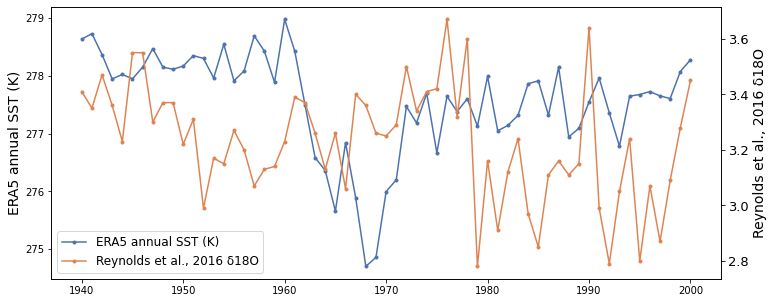

In [68]:
palette = sns.color_palette("deep", 8)

plt.figure().set_figwidth(12)

fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()

window = 5


lns1 = ax1.plot(time, Reynolds_nearest_coord_sst, marker = ".", label = "ERA5 annual SST (K)", color=palette[0])

lns2 = ax2.plot(Reynolds_date, Reynolds_d18O, marker = ".", label = "Reynolds et al., 2016 δ18O", color = palette[1])

ax1.set_ylabel('ERA5 annual SST (K)', fontsize=14)
ax2.set_ylabel('Reynolds et al., 2016 δ18O', fontsize=14)

lns = lns1+lns2
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc="lower left", fontsize=12)


plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.show()

<Figure size 864x288 with 0 Axes>

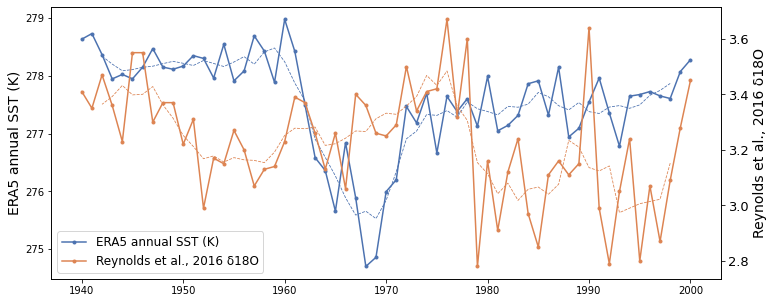

In [80]:
window = 5

ERA5_average_data = []
for ind in range(len(Reynolds_nearest_coord_sst) - window + 1):
    ERA5_average_data.append(np.mean(Reynolds_nearest_coord_sst[ind:ind+window]))
    

ERA5_average_time = []
for ind in range(len(time) - window + 1):
    ERA5_average_time.append(np.mean(time[ind:ind+window]))
    
Reynolds_average_data = []
for ind in range(len(Reynolds_d18O) - window + 1):
    Reynolds_average_data.append(np.mean(Reynolds_d18O[ind:ind+window]))
    

Reynolds_average_time = []
for ind in range(len(Reynolds_date) - window + 1):
    Reynolds_average_time.append(np.mean(Reynolds_date[ind:ind+window]))


plt.figure().set_figwidth(12)

fig, ax1 = plt.subplots(figsize=(12,5))
ax2 = ax1.twinx()

window = 5


lns1 = ax1.plot(time, Reynolds_nearest_coord_sst, marker = ".", label = "ERA5 annual SST (K)", color=palette[0])
ax1.plot(ERA5_average_time, ERA5_average_data, linestyle = "--", color=palette[0], linewidth  = 0.8)



lns2 = ax2.plot(Reynolds_date, Reynolds_d18O, marker = ".", label = "Reynolds et al., 2016 δ18O", color = palette[1])
ax2.plot(Reynolds_average_time, Reynolds_average_data, linestyle = "--", color=palette[1], linewidth  = 0.8)



ax1.set_ylabel('ERA5 annual SST (K)', fontsize=14)
ax2.set_ylabel('Reynolds et al., 2016 δ18O', fontsize=14)

lns = lns1+lns2
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc="lower left", fontsize=12)


plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.show()

r value: -0.34430949552328455
p value: 0.006585028323070243


(array([274., 275., 276., 277., 278., 279., 280.]),
 [Text(0, 274.0, '274'),
  Text(0, 275.0, '275'),
  Text(0, 276.0, '276'),
  Text(0, 277.0, '277'),
  Text(0, 278.0, '278'),
  Text(0, 279.0, '279'),
  Text(0, 280.0, '280')])

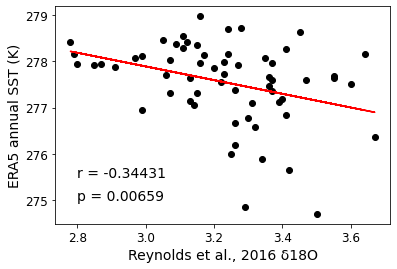

In [83]:
slope, intercept, rvalue, pvalue, stderr = stats.linregress(Reynolds_d18O[0:61], np.array(ERA5_1940_2000))
print("r value:", rvalue)
print("p value:", pvalue)

plt.scatter(Reynolds_d18O[0:61], np.array(ERA5_1940_2000), color = 'k')
plt.plot(Reynolds_d18O[0:61],slope*(Reynolds_d18O[0:61])+intercept, color= 'r', linestyle='-')#
#plt.plot(x1,y1, color = 'r', linestyle='--', linewidth = 0.5 )
plt.annotate("r = -0.34431", xy = (2.8, 275.5),color='k', fontsize = 14)
plt.annotate("p = 0.00659", xy = (2.8, 275),color='k', fontsize = 14)
plt.xlabel("Reynolds et al., 2016 δ18O", fontsize=14)
plt.ylabel("ERA5 annual SST (K)", fontsize=14)
plt.xticks(fontsize=12) 
plt.yticks(fontsize=12) 